In [1]:
import numpy as np # algèbre linéaire
import pandas as pd # procès de données, CSV file I/O (e.g. pd.read_csv)

import plotly.graph_objs as go

import plotly.offline as pyo


#from plotly.offline import iplot
import plotly.express as px

# librairie matplotlib
import matplotlib.pyplot as plt

# victorisation
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer


# import de NLK
import nltk

#import train_split
from  sklearn.model_selection import train_test_split

# learning models
from sklearn.linear_model import SGDClassifier, LogisticRegression, LogisticRegressionCV
from sklearn import svm
from sklearn.svm import SVC, LinearSVC
from sklearn.neighbors import KNeighborsClassifier 
from sklearn import tree

# import module time
from time import time

#import metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn.metrics import f1_score

from sklearn.pipeline import Pipeline
from sklearn.pipeline import make_pipeline


### Quelles éléments d'analyse 

Analyse quantitative du 2 eme dataSet 

Dimension : (40000, 4)

Taille : 80000

Catégories : 13
    ['empty', 'sadness', 'enthusiasm', 'neutral', 'worry', 'surprise',
       'love', 'fun', 'hate', 'happiness', 'boredom', 'relief', 'anger'],
    
Porportion des catégories :
empty  :  2.1 %
sadness  :  12.9 %
enthusiasm  :  1.9 %
neutral  :  21.6 %
worry  :  21.1 %
surprise  :  5.5 %
love  :  9.6 %
fun  :  4.4 %
hate  :  3.3 %
happiness  :  13.0 %
boredom  :  0.4 %
relief  :  3.8 %
anger  :  0.3 %

Vu le nombre imporant des catégories, leur taille est réduite, elle varie de 0.3% à 21.6%. Le poucentage de neuf catégories sur 13 n'excede pas les 10%. Cela laisse prévoir que que les modèles  d'apprentissage n'auront pas assez de données par catégorie.
    
Nous avons utilisé la même démarche que le premier data set à savoir les mêmes tests et avec les mêmes modèles.

models = (LogisticRegression(random_state=42, max_iter =1000),
          KNeighborsClassifier(n_neighbors=3),
          tree.DecisionTreeClassifier(),
          LinearSVC(),
          svm.SVC(kernel = 'linear'),
         SGDClassifier(max_iter=1000, tol=1e-3))
         
A l'inverse du 1er data set les résultat sont médiocre et ne dépasse pas les 0.3 % avec un temps de traitement de temps total : 494.78s.
A l'instar du 1 er datasat, le plus le plus performant en terme de score et rapité d'excution reste le SGDClassifier.
Les courbes de comapraison ont les mêmes allures pour le 1er dataset.

Sur ce dataset les scores des 5 modèles ne dépasse pas les 30%
avec des temps qui varient de 0.O37 s à 381 s.
Le modèle le plus performant en terme de score et rapidité d'excution pour ce dataset reste  le SGDClassifier. Le KNeighborsClassifier obtient le score le plus bas  avec un temps record de 0.037s. Si le temps le permet , nous revenons à cette étape pour tester plusieurs "n_neighbors=N". le svm.SVC(kernel = 'linear') représente le le temps de traitement le plus lent. Pour les prochaines tests, nous l'éliminerons le svm.

En utilisant un parametre ngram (1,2) avec le modèle qui a obtenu le meilleur résultat, en l'occurance le SGD, Nous remarquons que le f1score passe à 0.309 avec une pipeline au lieu de 0.298 . Donc il y a une lègère augementation du score, avec une augmentation du temps de traitement qui passe de  1.226 à 4.546. Pour les prochaines tests suivants, nous n'utiliserons pas ce paramètre.

Les pipes lines avec un ("stop_words") on observe une  légèrement augementation des scores pour les uns et une légère baisse pour les autre, tout en augmentant le temps de traitement. Cependant les score ne depasse pas toujours les 30%.

le record au tfidf n'a pas amélioré non plus le résultat. Nous allons regarder la matrice de confusion et réduire le nombre des classe pour ne garder que les 6 classes du premier dataset. 
LA matrice de confusion révèle que 7 catégories possèdent un score qui ne dépasse pas les 10 %. 
Dans un deuxième temps, nous gardons que les 6 catégories en question. Nous remplaçons 'happiness" par 'happy" et "worry" par "fair". 
Nous appliquerons le classifer qui a obtenu le meilleur résulat , en terme de temps d'excution et f1_score:
    Time: 0.708
    f1_score 0.451
La matrice de confusion montre que les scores sont trés bas et avoisinent le 0 pour anger par exemple.
Pour la suite et en vu de préparer le dataset2 au fusion avec le premier, nous allons garder que 6 émotions. renomant 'hapiness' en 'happy' et 'worry' en 'fear'(la catégorié qui s'apparente le plus).
Nous obtenons un data set de taille : (16513, 2) qui sera utilisé pour la fusion.

Nous ferons un test pipe line avec le modele le plus performant avec stop_words. Nous obtenons les résultats suivants.
     Time: 0.433
     f1_score 0.539
     
Celà note une petite amélioration mais le résultat reste médiocre.

Sans un traitement en proffondeur du corpus, aucun classifier ne pourra obtenir un score meilleur.

In [32]:
# Chargement des données qui seront utilisées.
dataw = pd.read_csv('text_emotion.csv')


In [33]:


# Préparation des données
# preparation des targets
corpus = np.array(dataw["content"])
targets = np.array(dataw["sentiment"])

#la liste des émotions
listEmotion = dataw["sentiment"].unique()


# encodage des données
# remplacer ['sadness' 'anger' 'love' 'surprise' 'fear' 'happy'..] par 1, 2,3, 4, 5

#dataw["sentiment"] = dataw["sentiment"].astype('category').cat.codes 


# les différentes figures

fig = px.histogram(x=targets, nbins=4).update_xaxes(categoryorder = 'total descending') # targets non encodé
fig.show()

In [4]:
px.histogram(dataw,x="sentiment", color="sentiment", marginal="rug", hover_name="content", histfunc="sum")

In [5]:
# la liste des émotions encodées

listEmotionCat = dataw["sentiment"].unique()

# le pourcentage des différents sentiments :
# definition d'une fonction qui calcule le pourcentage d'un sentiment par rapport à la taille du data set:

def sumEmotion (l,sentiment) :
    i = 0
    sum = 0
    for i in range (len(l)):
        if l[i] == sentiment:
            sum += 1
    return round(sum)



In [6]:
# le pourcentage de chaque émotion dans le 2eme dataset
# listE englobe la somme de chaque émotion ds le dataset

listE = []
sumE = 0
percentageE =[]
for i in range (len(listEmotion)):
    sumE = sumEmotion(dataw["sentiment"],listEmotionCat[i])
    print(listEmotion[i], " : ", round((sumE/len(dataw["sentiment"]))*100,1) , "%")
    listE.append(sumE)
    percentageE.append(round((sumE/len(dataw["sentiment"]))*100,1))
    

fig = go.Figure(data=[go.Table(header=dict(values=['Sentiment', 'sum', '%']),
                 cells=dict(values=[listEmotion,listE,percentageE ]))
                     ])
fig.show()

empty  :  2.1 %
sadness  :  12.9 %
enthusiasm  :  1.9 %
neutral  :  21.6 %
worry  :  21.1 %
surprise  :  5.5 %
love  :  9.6 %
fun  :  4.4 %
hate  :  3.3 %
happiness  :  13.0 %
boredom  :  0.4 %
relief  :  3.8 %
anger  :  0.3 %


In [7]:
fig = px.pie(values=listE, names=listEmotion, title='Pourcentage des Emotions')
fig.show()

 


### Faire une première itération en utilisant countVectorizer sans faire le pretraitement avec NLTK

In [34]:
stop_words = nltk.corpus.stopwords.words("english")
# Vobabulary analysis
cv = CountVectorizer(stop_words = stop_words)
X= cv.fit_transform(corpus)
words = cv.get_feature_names()

print(X.shape)
print("vocabulary size; %d" % len(words) )

(40000, 48070)
vocabulary size; 48070


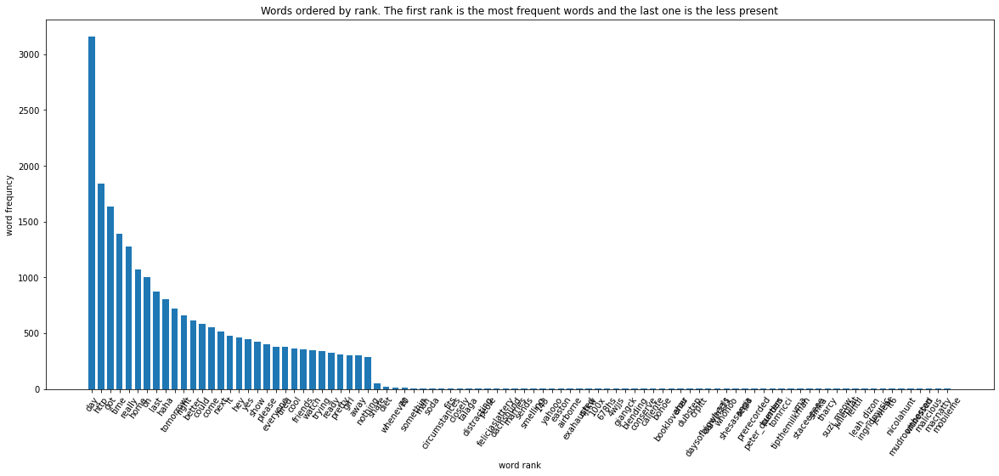

In [35]:
# voir la distribution des mots


wsum = np.array(X.sum(0))[0]
ix = wsum.argsort()[::-5]
wrank = wsum[ix] 
labels = [words[i] for i in ix]

# Sub-sample the data to plot.
# take the 20 first + the rest sample with the given step 
def subsample(x, step=150):
    return np.hstack((x[:30], x[30::step]))


plt.figure(figsize=(20,8))
freq = subsample(wrank)
r = np.arange(len(freq))
plt.bar(r, freq, width=0.7)
plt.xticks(r, subsample(labels), rotation=55)
plt.xlabel('word rank')
plt.ylabel('word frequncy')
plt.title("Words ordered by rank. The first rank is the most frequent words and the last one is the less present");



### Proposer plusieurs modèles de classification des émotions Pour le 2eme dataset

In [36]:
# définition de la fonction fitting(X,y,model)
# jeu test2 : test_size =0.2



X_train, X_test, y_train, y_test = train_test_split(X,targets, test_size =0.2, random_state=42)


def fitting (X,y, mod):
    model.fit(X,y)
    
# définition de la function prédiction(X, model):
def prediction (X, mod):
    pred = mod.pred(X)
    return pred


# définition d'une fonction learning qui englobe le fit et le predict
# nous retrourne le T et le f1_score

def learning (X_train, X_test, y_train, y_test, mod) :
    #learn 
    start = time()
    mod.fit(X_train,y_train)
    T= time()-start
   
    #predict
    y_pred = model.predict(X_test)
    f1Score = f1_score(y_test, y_pred, average='weighted')
    return (T, f1Score)

In [37]:



#définition d'une liste de modèles

models = (LogisticRegression(random_state=42, max_iter =1000),
          KNeighborsClassifier(n_neighbors=3),
          tree.DecisionTreeClassifier(),
          LinearSVC(),
          svm.SVC(kernel = 'linear'),
         SGDClassifier(max_iter=1000, tol=1e-3))

names = ["Logistic Regression", "KNeighbors", "DecisionTree", "svm", "SGD"]

# liste time et f1_score
t=[]
f1Score= []
startf = time()
for model in models:
    t1, f1 = learning(X_train, X_test, y_train, y_test,model)
    t.append(round(t1,3))
    f1Score.append(round(f1,3)
                  )
names = ["LogReg", "KNeig", "DTree","svml","svm", "SGD"]  

time_f = time()- startf
# mettre les résultats ds un tableau

set = np.array([names,t,f1Score])

print("temps total :", round(time_f,3))
#print result

fig = go.Figure(data=[go.Table(header=dict(values=['Classifier','Time', 'Score']),
                 cells=dict(values=[names,t,f1Score]))
                     ])
fig.show()


/home/sacia/anaconda3/envs/MachineLearning/lib/python3.7/site-packages/sklearn/svm/_base.py:977: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



temps total : 513.833


In [38]:
#mettre les résultats d'un dictionnaire et le convertir ds un dataframe
dict_result = {}
dict_result ['Classifier'] = names
dict_result ['Time'] = t
dict_result ['f1Score'] = f1Score

In [39]:
df = pd.DataFrame.from_dict(dict_result)
# Pour dash
df.to_csv('result2.csv')
df2 = pd.read_csv('result2.csv')
df2

,Unnamed: 0,Classifier,Time,f1Score
0,0,LogReg,41.849,0.307
1,1,KNeig,0.036,0.203
2,2,DTree,32.380,0.268
3,3,svml,26.064,0.280
4,4,svm,382.010,0.300
5,5,SGD,1.362,0.299


Sur ce dataset les scores des 5 modèles ne dépasse pas les 30%
avec des temps qui varient de 0.O37 s à 381 s.
Le modèle le plus performant en terme de score et rapidité d'excution pour ce dataset reste  le SGDClassifier. Le KNeighborsClassifier obtient le score le plus bas  avec un temps record de 0.037s. Si le temps le permet , nous revenons à cette étape pour tester plusieurs "n_neighbors=N". le svm.SVC(kernel = 'linear') représente le le temps de traitement le plus lent. Pour les prochaines tests, nous l'éliminerons.

In [40]:
# Utilisation du principe de pipeline sans faire reccord au "stop_word" avec les mêmes modèles 
# Préparation des X_train, X_test, y_train, y_test

targets = np.array(dataw["sentiment"]) # targets encodé

X_train, X_test, y_train, y_test = train_test_split(corpus,targets, test_size =0.2, random_state=42)


In [41]:

# en utilisant un parametre ngram  (1,2) avec le modèle le plus rapide
pipe0 = Pipeline([
    ('vect', CountVectorizer(ngram_range=(1,2))),
    ('sgd', SGDClassifier())
     ])


In [42]:
# Learn
start = time()
pipe0.fit(X_train, y_train)
t = time() - start

# predict and save results
y_pred = pipe0.predict(X_test)
f1Score = f1_score(y_test, y_pred, average='weighted')
                
print("le modèle le plus rapide avec un ngram (1,2)", round(t,3), round(f1Score,3))      

le modèle le plus rapide avec un ngram (1,2) 4.406 0.304


En utilisant un parametre ngram (1,2) avec le modèle qui a obtenu le meilleur résultat, en l'occurance le SGD, Nous remarquons que le f1score passe à 0.309 avec une pipeline au lieu de 0.298 . Donc il y a une lègère augementation du score, avec une augmentation du temps de traitement qui passe de  1.226 à 4.546. Pour les prochaines tests suivants, nous n'utiliserons pas ce paramètre.

In [43]:
# Utilisation du principe de pipeline sans faire reccord au "stop_words" avec les mêmes modèles 
# Préparation des X_train, X_test, y_train, y_test

# Nous n'avons qu'a définir notre liste de pipe line et l'injecter dans la fonction learning à la place de models
#définition d'une liste de modèles

X_train, X_test, y_train, y_test = train_test_split(corpus,targets, test_size =0.2, random_state=42)



pipe1 = Pipeline([
    ('vect', CountVectorizer()),
    ('logit', LogisticRegression(random_state=42, max_iter =2000)),
    ])

pipe2 = Pipeline([
    ('vect', CountVectorizer()),
    ('kngb', KNeighborsClassifier(n_neighbors=3))
    ])

pipe3 = Pipeline([
    ('vect', CountVectorizer()),
    ('tree', tree.DecisionTreeClassifier())
     ])

pipe4 = Pipeline([
    ('vect', CountVectorizer()),
    ('svml',  LinearSVC())
     ])

pipe5 = Pipeline([
    ('vect', CountVectorizer()),
    ('sgd', SGDClassifier())
     ])


# liste time  ,  f1_score, pipeline

tP = []
 
f1ScoreP = []

pipes = [pipe1,pipe2,pipe3,pipe4,pipe5]

for pipe in pipes:
    
    # Learn
    start = time()
    pipe.fit(X_train, y_train)
    t1 = time() - start
    print()
    # predict and save results
    y_pred = pipe.predict(X_test)
    f1 = f1_score(y_test, y_pred, average='weighted')
    
    # save time and score
    tP.append(round(t1,3))
    f1ScoreP.append(round(f1,3))
    
time_f = time()- start
names = ["LogReg", "KNeig", "DTree", "svml", "SGD"]  
# mettre les résultats ds un tableau

#set = np.array([names,t,f1Score])

#print(set)
print("Utilisation du principe de pipeline sans faire reccord aux stop_words avec les mêmes modèles ")
print("temps total :", round(time_f,3))

fig4 = go.Figure(data=[go.Table(header=dict(values=['Classifier','Time', 'Score']),
                 cells=dict(values=[names,t,f1Score]))
                     ])
fig4.show()


/home/sacia/anaconda3/envs/MachineLearning/lib/python3.7/site-packages/sklearn/svm/_base.py:977: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.





Utilisation du principe de pipeline sans faire reccord aux stop_words avec les mêmes modèles 
temps total : 3.286


In [46]:
fig4 = go.Figure(data=[go.Table(header=dict(values=['Classifier','Time', 'Score']),
                 cells=dict(values=[names,tP,f1ScoreP]))
                     ])
fig4.show()

In [47]:

#mettre les résultats d'un dictionnaire et le convertir ds un dataframe
dict_result21 = {}
dict_result21['Classifier'] = names
dict_result21 ['TimePipe'] = tP
dict_result21['f1ScorePipe'] = f1ScoreP

df21 = pd.DataFrame.from_dict(dict_result21)
df21

,Classifier,TimePipe,f1ScorePipe
0,LogReg,50.116,0.312
1,KNeig,0.637,0.199
2,DTree,26.280,0.258
3,svml,34.984,0.288
4,SGD,3.014,0.306


Les pipes lines avec un ("stop_words") on observe une  légèrement augementation des scores pour les uns et une légère baisse pour les autre, tout en augmentant le temps de traitement. Cependant les score ne depasse pas toujours les 30%.

In [48]:
# comaparaison des performances des cinq classifiers selon le f1score
figPipe2 = go.Figure()
figPipe2.add_trace(go.Scatter(x=df2["Classifier"], y=df2["f1Score"],
                    mode='lines',
                    name='Sans piple_line'))
figPipe2.add_trace(go.Scatter(x=df21["Classifier"], y=df21["f1ScorePipe"],
                    mode='lines+markers',
                    name='Avec piple_Line'))


In [49]:
# comaparaison des performances des cinq classifiers selon le f1score
figTime2 = go.Figure()
figTime2.add_trace(go.Scatter(x=df2["Classifier"], y=df2["Time"],
                    mode='lines',
                    name='Sans piple_line'))

figTime2.add_trace(go.Scatter(x=df21["Classifier"], y=df21["TimePipe"],
                    mode='lines+markers',
                    name='Avec piple_Line'))

In [52]:
#pour dash
#df21.to_csv('result21.csv')
#df21 =pd.read_csv('result21.csv') 
#df21

In [21]:
# Utilisation de pipe line avec un avec stopwords pour le modèle le plus performant.
pipe01 = Pipeline([
    ('vect-stop', CountVectorizer(strip_accents="unicode", stop_words=stop_words)),
    #('tfidf', TfidfTransformer()),
    ('sgd', SGDClassifier())
    ])

In [22]:
# Learn
start = time()
pipe01.fit(X_train, y_train)
t1 = time() - start
print()
 # predict and save results
y_pred = pipe01.predict(X_test)
f1 = f1_score(y_test, y_pred, average='weighted')
print ("Test pipe line avec le modele le plus performant avec l'utilisation des stop_words")
print (round(t1,3))
print (round(f1,3))


Test pipe line avec le modele le plus performant avec l'utilisation des stop_words
2.391
0.299


le record au tfidf n'a pas amélioré non plus le résultat. Nous allons regarder la matrice de confusion et réduire le nombre des classe pour ne garder que les 6 classes du premier dataset. 
LA matrice de confusion révèle que 7 catégories possèdent un score qui ne dépasse pas les 10 %. 
Dans un deuxième temps, nous gardons que les 6 catégories en question. Nous remplaçons 'happiness" par 'happy" et "worry" par "fair". 
Nous appliquerons le classifer qui a obtenu le meilleur score.
les résulats obtenus sont les suivants.
    Time: 0.708
    f1_score 0.451
    


In [23]:

print(classification_report(y_test, y_pred))

print("=======")
conf = confusion_matrix(y_test, y_pred)
conf


              precision    recall  f1-score   support

       anger       0.00      0.00      0.00        19
     boredom       0.00      0.00      0.00        31
       empty       0.04      0.01      0.02       162
  enthusiasm       0.03      0.01      0.01       163
         fun       0.09      0.05      0.06       338
   happiness       0.30      0.30      0.30      1028
        hate       0.27      0.25      0.26       268
        love       0.38      0.43      0.40       762
     neutral       0.35      0.47      0.40      1740
      relief       0.18      0.06      0.09       352
     sadness       0.31      0.29      0.30      1046
    surprise       0.11      0.05      0.07       425
       worry       0.34      0.39      0.36      1666

    accuracy                           0.32      8000
   macro avg       0.18      0.18      0.18      8000
weighted avg       0.29      0.32      0.30      8000



array([[  0,   0,   0,   0,   0,   2,   1,   0,   4,   0,   3,   0,   9],
       [  0,   0,   1,   1,   1,   1,   0,   2,   6,   0,  10,   1,   8],
       [  0,   2,   2,   0,   1,  11,   5,   8,  86,   2,  14,   1,  30],
       [  0,   0,   4,   1,   9,  20,   5,   7,  58,   2,  11,   5,  41],
       [  1,   0,   2,   0,  17,  90,   8,  36,  82,   5,  26,  11,  60],
       [  0,   0,   4,   6,  42, 310,   7, 156, 269,  17,  61,  30, 126],
       [  0,   0,   6,   2,   3,   8,  68,   5,  63,   2,  39,   8,  64],
       [  0,   0,   3,   2,  14, 138,   9, 327, 135,  11,  40,   9,  74],
       [  1,   2,  11,  10,  38, 156,  35, 114, 817,  25, 146,  40, 345],
       [  1,   0,   0,   3,  11,  60,   9,  32,  95,  22,  31,  14,  74],
       [  0,   3,   8,   2,  16,  58,  52,  42, 201,  12, 307,  22, 323],
       [  0,   1,   2,   0,   8,  60,   8,  35, 137,   4,  36,  21, 113],
       [  3,   2,  13,   7,  31, 106,  44,  92, 401,  19, 263,  37, 648]])

In [24]:
#suppression des colonnes inutiles 
dataw.drop(['tweet_id', 'author'], axis = 1, inplace = True)


In [287]:
datalove = dataw[dataw.sentiment=="love"].iloc[:,:]
datasadness = dataw[dataw.sentiment=="sadness"].iloc[:,:]
datasurprise = dataw[dataw.sentiment=="surprise"].iloc[:,:]
datahappiness = dataw[dataw.sentiment=="happiness"].iloc[:,:]
dataanger = dataw[dataw.sentiment=="anger"].iloc[:,:]
dataworry = dataw[dataw.sentiment=="worry"].iloc[:,:]


In [288]:
#dataworry = dataw[dataw.sentiment=="worry"].iloc[:,:]

In [289]:
dataworry = dataworry['sentiment'].replace({"worry":"fear"}, inplace=True)

/home/sacia/anaconda3/envs/MachineLearning/lib/python3.7/site-packages/pandas/core/series.py:4569: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [290]:
dataNew = pd.concat([datalove,datasadness,datasurprise,datahappiness,dataanger,dataworry])
corpus = np.array(dataNew["content"])
targets = np.array(dataNew["sentiment"])

In [296]:
dataNew.to_csv('datawNew.csv')
pdN = pd.read_csv('datawNew.csv')

In [306]:
dataNew.shape

(16513, 2)

In [292]:
X_train, X_test, y_train, y_test = train_test_split(corpus,targets, test_size =0.2, random_state=42)

# Utilisation de pipe line avec un avec stopwords pour le modèle le plus performant.
pipe01 = Pipeline([
    ('vect-stop', CountVectorizer(strip_accents="unicode", stop_words=stop_words)),
    ('tfidf', TfidfTransformer()),
    ('sgd', SGDClassifier())
    ])

In [293]:
# Learn
start = time()
pipe01.fit(X_train, y_train)
t1 = time() - start
print()
 # predict and save results
y_pred = pipe01.predict(X_test)
f1 = f1_score(y_test, y_pred, average='weighted')
print ("Test pipe line avec le modele le plus performant avec stop_words")
print (" Time:", round(t1,3))
print ("f1_score", round(f1,3))


Test pipe line avec le modele le plus performant avec stop_words
 Time: 0.433
f1_score 0.539


In [218]:
print(classification_report(y_test, y_pred))

print("=======")
conf = confusion_matrix(y_test, y_pred)
conf

              precision    recall  f1-score   support

       anger       0.00      0.00      0.00        25
        fear       0.48      0.68      0.57      1663
   happiness       0.46      0.50      0.48      1032
        love       0.54      0.48      0.51       790
     sadness       0.44      0.31      0.36      1045
    surprise       0.27      0.05      0.08       440

    accuracy                           0.48      4995
   macro avg       0.36      0.34      0.33      4995
weighted avg       0.46      0.48      0.45      4995



array([[   0,   15,    5,    1,    3,    1],
       [   1, 1133,  189,   69,  247,   24],
       [   0,  284,  515,  151,   66,   16],
       [   0,  151,  201,  382,   47,    9],
       [   0,  546,  105,   62,  321,   11],
       [   0,  217,  110,   42,   49,   22]])

Les deux emotions "anger" et "surprise" possède un score qui ne dépasse par les 10%.
ce qui explique le score bas obtenu. 
Sans un traitement en proffondeur du corpus, aucun classifier ne pourra obtenir un score meilleur.